# Исследование рынка общественного питания города Москвы

Инвесторы решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**Задача** - Исследование рынка общественного питания на основе открытых данных, подготовка презентации.

**Описание данных**:

- Файл moscow_places.csv:
 - name — название заведения;
 - address — адрес заведения;
 - category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 - hours — информация о днях и часах работы;
 - at — широта географической точки, в которой находится заведение;
 - lng — долгота географической точки, в которой находится заведение;
 - rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
 - price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 - avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  «Средний счёт: 1000–1500 ₽»;
  «Цена чашки капучино: 130–220 ₽»;
  «Цена бокала пива: 400–600 ₽».
  и так далее;
 - middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
 - middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
 - chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
 - district — административный район, в котором находится заведение, например Центральный административный округ;
 seats — количество посадочных мест.

## Загрузка данных и подготовка их к анализу

Загрузим и подготовим данные к анализу

### Загрузка данных

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
import seaborn as sns
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

In [3]:
#посмотрим на полученный датафрейм
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
#посмотрим общую информацию о датафрейме
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В наборе данных содержится 8406 записей заведений и 14 характеристик. В данных присутствуют пропущенные значения в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats, что может потребовать дополнительной предобработки данных. Большинство признаков представлены строковым типом данных (object), часть требует преобразования для дальнейшего анализа. Некоторые признаки, такие как "lat", "lng", "rating", "middle_avg_bill", "middle_coffee_cup" и "seats" представлены числовыми данными.
Столбцы "category", "district" и "price" являются категориальными и могут быть использованы для анализа распределения заведений по категориям и районам города, а также для определения ценовой категории.

In [5]:
#посмотрим, сколько уникальных заведений представлено
data['name'].nunique()

5614

Количество уникальных названий заведений (5614) меньше общего числа записей (8406) из-за того, что в данных возможно могут присутствовать множественные записи для одного и того же заведения. Это может произойти по разным причинам: 1) Если у сетевого заведения есть несколько филиалов, каждый из них будет представлен как отдельная запись в наборе данных, но с одним и тем же названием. 2) Возможно, что для одного заведения были разные варианты написания названия, различия в адресе или других характеристиках. Это могло привести к созданию нескольких записей для одного и того же заведения. 3) В данных могут присутствовать дубликаты записей, которые могут быть вызваны ошибками в процессе сбора данных или ошибочным объединением информации из разных источников.
Для анализа данных и получения более точной картины рынка общественного питания важно учитывать это различие и, при необходимости, корректно обрабатывать дубликаты или объединять данные по заведениям.

In [6]:
#Выведем количество пропущенных значений для каждого столбца
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Из вывода видно, что столбцы "hours", "price", "avg_bill", "middle_avg_bill", "middle_coffee_cup" и "seats" содержат пропущенные значения. 
- 1) hours содержит 536 пропущенных значений, что может указывать на отсутствие информации о часах работы некоторых заведений.
- 2) price содержит большое количество пропущенных значений (5091), что может означать, что ценовая категория не была указана для многих заведений 
- 3) avg_bill: Также содержит значительное количество пропущенных значений (4590), возможно, информация о среднем чеке не была указана для всех заведений.
- 4) middle_avg_bill имеет 5257 пропущенных значений. Этот столбец содержит числовые данные и указывает на средний чек, но для большого количества заведений эта информация отсутствует. 
- 5) middle_coffee_cup содержит 7871 пропущенных значений. Похоже, что для большинства заведений отсутствует информация о цене чашки капучино.
- 6) В столбце "seats" также много пропущенных значений (3611), что может означать, что количество посадочных мест не было указано для некоторых заведений.

Для анализа этих данных можно использовать различные методы обработки пропущенных значений, такие как заполнение средними или медианными значениями, удаление строк с пропущенными значениями или другие методы. Однако, здесь заполнение пропусков только исказит данные. Глобально много пропусков в ценах и количестве мест. Цены зависят от слишком многих факторов: район, тип заведения, принадлежность к сети и т.д. Учесть их все при заполнении средними не получится. А в количество мест мы не найдем внятную логику заполнения. 

### Предобработка данных

In [7]:
# Посмотрим на количество дубликатов
data.duplicated().sum()

0

In [8]:
#приведем к нижнему регистру наименования и адреса заведений
data['address'] = data['address'].str.lower()
data['name'] = data['name'].str.lower()

In [9]:
#проверим наличие неявных дубликатов
# Проверим комбинацию столбцов на уникальность
duplicate_combinations = data.duplicated(subset=['name', 'address'])
# Выведем строки, где обнаружены дубликаты
duplicates_data =  data[duplicate_combinations]

In [10]:
duplicates_data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


обнаружено 4 дубликата

In [11]:
# уберем из датасета обнаруженные дубликаты
data = data.drop_duplicates(subset=['name', 'address'])

In [12]:
#проверим, удалось ли убрать
# Проверим комбинацию столбцов на уникальность
duplicate_combinations2 = data.duplicated(subset=['name', 'address'])
# Выведем строки, где обнаружены дубликаты
duplicates_data2 =  data[duplicate_combinations2]

In [13]:
duplicates_data2

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [14]:
#посмотрим на общий датафрейм
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.6+ KB


Неявные дубликаты были удалены, в общем датафрейме теперь на 4 записи меньше

Создадим столбец с названием улицы, для этого выделим данную строку из столбца address

In [15]:
#возьмем второй элемент из строки с адресом, однако, при обозначение МКАД, возьмем 3-ий элемент
data['street'] = data['address'].apply(lambda x: x.split(',')[2] if 'МКАД' in x else x.split(',')[1])

In [16]:
data.head(30)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица
5,sergio pizza,пиццерия,"москва, ижорская улица, вл8б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,ижорская улица
6,огни города,"бар,паб","москва, клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,клязьминская улица
7,mr. уголёк,быстрое питание,"москва, клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,клязьминская улица
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,дмитровское шоссе
9,готика,кафе,"москва, ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,ангарская улица


Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

In [17]:
data['is_24_7']= data['hours'].apply(lambda x: True if 'ежедневно, круглосуточно' in str(x) else False)

In [18]:
#проверим, что получилось
data.head(50)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
5,sergio pizza,пиццерия,"москва, ижорская улица, вл8б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,ижорская улица,False
6,огни города,"бар,паб","москва, клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,клязьминская улица,False
7,mr. уголёк,быстрое питание,"москва, клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,клязьминская улица,False
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,дмитровское шоссе,False
9,готика,кафе,"москва, ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,ангарская улица,False


## Анализ данных

### Определим, какие категории заведений представлены в данных
Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.

In [19]:
#посмотрим на ункальные наименования категорий:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [20]:
#подсчитаем количество заведений для каждой категории
category_count = data['category'].value_counts().sort_values(ascending=False)

In [21]:
category_count.name = 'Количество заведений'

In [22]:
category_count

кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: Количество заведений, dtype: int64

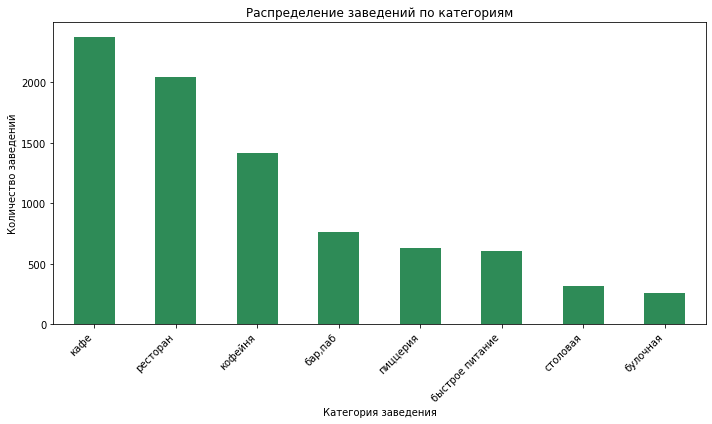

In [23]:
# Построим график
plt.figure(figsize=(10, 6))
category_count.plot(kind='bar', color='seagreen')
plt.title('Распределение заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Согласно полученному графику, наиболее многочисленными категориями, представленными в датафрейме, являются кафе, рестораны и кофейни

### Исследование количества посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 
Построим визуализации. Проанализируем результаты и сделаем выводы.

In [24]:
#сгруппируем данные по категориям и посчитаем для каждой категории среднее количество посадочных мест
count_seats = data.groupby('category')['seats'].agg('mean').sort_values(ascending=False)

In [25]:
count_seats

category
бар,паб            124.477516
ресторан           121.892041
кофейня            111.199734
столовая            99.750000
быстрое питание     98.891117
кафе                97.365653
пиццерия            94.496487
булочная            89.385135
Name: seats, dtype: float64

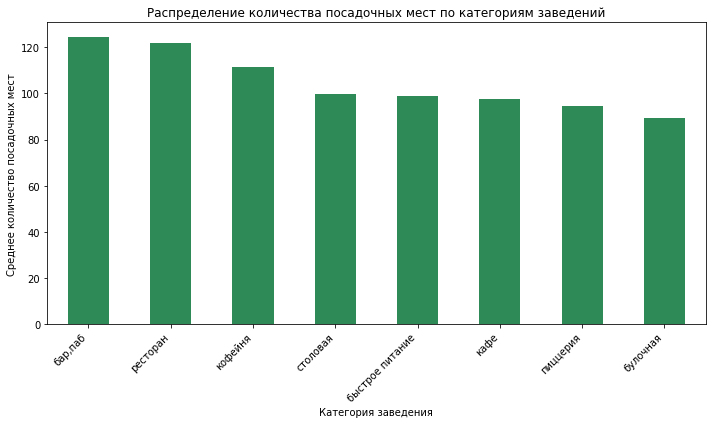

In [26]:
# Построим график
plt.figure(figsize=(10, 6))
count_seats.plot(kind='bar', color='seagreen')
plt.title('Распределение количества посадочных мест по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Среднее количество посадочных мест')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Попробуем еще построить график "ящик с усами", чтобы увидеть, до каких рамок эти значения могут изменяться.

Text(0, 0.5, 'Среднее количество посадочных мест')

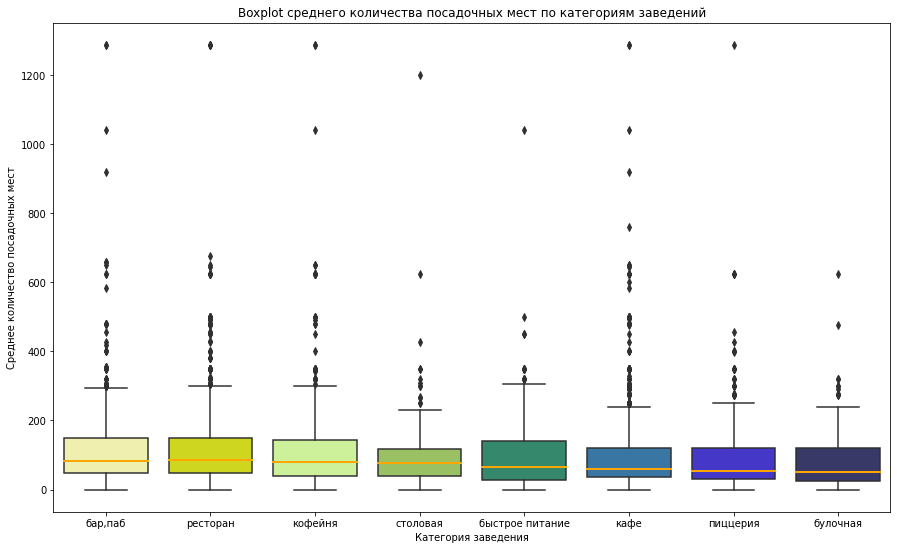

In [27]:
plt.figure(figsize=(15, 9))
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F"]
sns.boxplot(x='category', y='seats', data=data, order=count_seats.index, 
            palette=custom_palette, medianprops={'color': 'orange', 'linewidth': 2})
plt.title('Boxplot среднего количества посадочных мест по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Среднее количество посадочных мест')

Согласно полученным данным, наибольшее количество посадочных мест в ресторане, баре, кофейне. Это может быть обусловлено тем, что эти типы заведений чаще всего предназначены для длительного пребывания посетителей, проведения встреч, обедов и ужинов. Наименьшее - в пиццерии, булочной,  где клиенты чаще предпочитают заказывать еду на вынос или доставку, чем проводить время внутри заведения. В таких местах обычно ограниченное количество посадочных мест для клиентов, которые хотят перекусить на месте.

Медианное значение (50-й процентиль) количества посадочных мест:
Для баров и пабов: 82.5 мест.
Для булочных: 50 мест.
Для быстрого питания: 65 мест.
Для кафе: 60 мест.
Для кофеен: 80 мест.
Для пиццерий: 55 мест.
Для ресторанов: 86 мест.
Для столовых: 75.5 мест.
Наибольший размах наблюдается у ресторанов (от 0 до 1288 мест), что указывает на наличие как небольших, так и очень больших ресторанов. Для остальных категорий размах колеблется в пределах от 0 до примерно 100-150 мест, с некоторыми выбросами в большую сторону. Для большинства категорий (кроме баров, пабов и ресторанов) стандартное отклонение значительно меньше среднего значения, что указывает на относительно маленький разброс данных. У баров, пабов и ресторанов стандартное отклонение больше среднего значения, что свидетельствует о более значительном разбросе данных.
Средние значения и квартили также позволяют понять типичный размер заведения в каждой категории. Например, для кафе и кофеен типичными являются заведения с количеством посадочных мест в диапазоне от 35 до 120.

### Исследование соотношения сетевых и несетевых заведений в датасете. 

In [28]:
# Подсчитаем количество сетевых и несетевых заведений
chain_counts = data['chain'].value_counts()

In [29]:
chain_counts

0    5199
1    3203
Name: chain, dtype: int64

Сетевые заведения представлены в количестве 3205, а несетевые - 5201

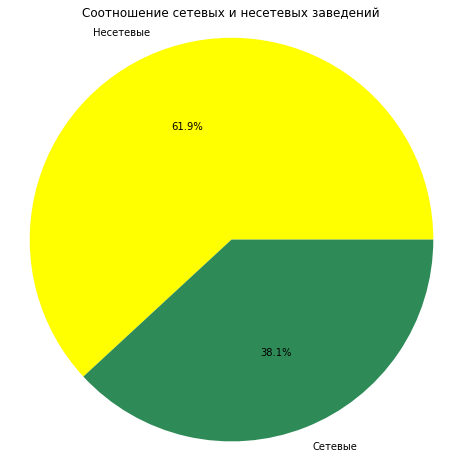

In [30]:
# Создадим круговую диаграмму для визуализации полученных данных
plt.figure(figsize=(8, 8))
plt.pie(chain_counts, labels=['Несетевые', 'Сетевые'], autopct='%1.1f%%', colors=['yellow', 'seagreen'])
plt.title('Соотношение сетевых и несетевых заведений')
# Зададим равные пропорции, чтобы круг выглядел как круг
plt.axis('equal') 
plt.show()

Как видим, несетевых заведений (61.9% от общего числа) почти в 2 раза больше, чем сетевых (38,1% от общего числа).

### Определим, какие категории заведений чаще являются сетевыми

In [31]:
#для начала выделим только сетевые заведения
chains = data[data['chain'] == 1]

In [32]:
#проверим
chains.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
13,буханка,булочная,"москва, базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,базовская улица,False
19,пекарня,булочная,"москва, ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,ижорский проезд,True
20,чебуреки манты,кафе,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0,правобережная улица,False
23,буханка,булочная,"москва, лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,лобненская улица,False
24,drive café,кафе,"москва, улица дыбенко, 9ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,True
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
29,кушай город,столовая,"москва, дмитровское шоссе, 157, стр. 15",Северный административный округ,пн-пт 09:00–16:00,55.898414,37.539256,4.2,средние,Средний счёт:200–250 ₽,225.0,NaN,1,NaN,дмитровское шоссе,False
32,додо пицца,пиццерия,"москва, коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0,коровинское шоссе,False
34,домино'с пицца,пиццерия,"москва, клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,клязьминская улица,False


In [33]:
#посчитаем 
chains_category_count = chains['category'].value_counts().sort_values(ascending=False)

In [34]:
chains_category_count

кафе               779
ресторан           729
кофейня            720
пиццерия           330
быстрое питание    232
бар,паб            168
булочная           157
столовая            88
Name: category, dtype: int64

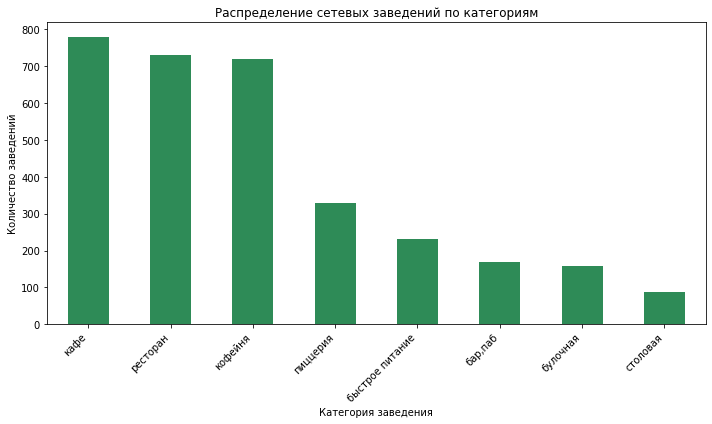

In [35]:
# Построим график
plt.figure(figsize=(10, 6))
chains_category_count.plot(kind='bar', color='seagreen')
plt.title('Распределение сетевых заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Как видим, лидируют в этом рейтинге также кафе, рестораны и кофейни, меньше всего сетевых столовых, булочных и пабов

Можно, для интереса также посмотреть как отличаются данные от несетевых

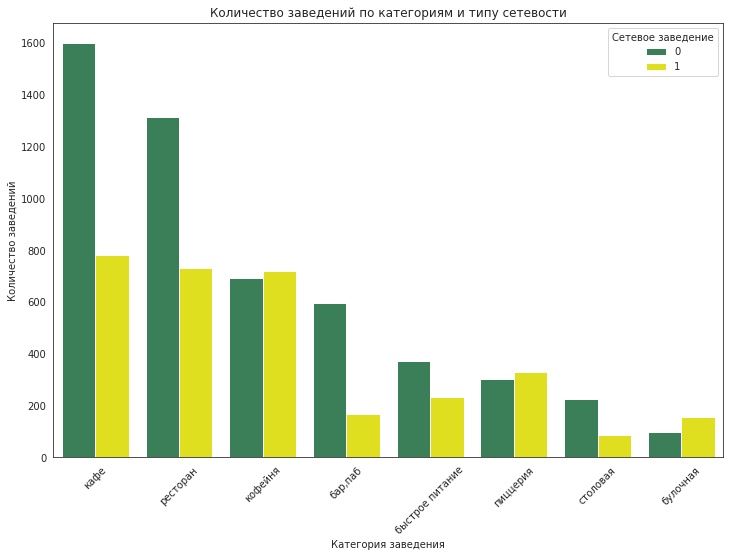

In [36]:
#Построим график
# Сгруппируем данные по категории и сетевому признаку, затем посчитаем количество записей
category_counts = data.groupby(['category', 'chain']).size().reset_index(name='count')
# Отсортируем данные в порядке уменьшения количества заведений
category_counts_sorted = category_counts.sort_values(by='count', ascending=False)
# Назначаем размер графика
plt.figure(figsize=(12, 8))
sns.set_style('white')
# Строим столбчатый график
sns.barplot(x='category', y='count', data=category_counts_sorted, hue='chain', palette=['seagreen', 'yellow'])                 
# Добавляем заголовок графика и подписи осей
plt.title('Количество заведений по категориям и типу сетевости')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
# Поворачиваем подписи значений по оси X на 45 градусов для улучшения читаемости
plt.xticks(rotation=45)
# Показываем легенду
plt.legend(title='Сетевое заведение')
# Отображаем график
plt.show()

Если посмотреть на этот график, среди кафейн, пиццерий и булочных больше сетевых заведений, чем несетевых. Для остальных заведений большее количество заведений являются несетевыми.

### Определим топ-15 популярных сетей в Москве. 

Для начала, сгруппируем исходный датафрейм по названию и определим 15 наиболее встречающихся названий

In [37]:
top_names = data['name'].value_counts().sort_values(ascending=False).head(15)

In [38]:
top_names

кафе                                   188
шоколадница                            120
домино'с пицца                          77
додо пицца                              74
one price coffee                        72
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
шаурма                                  43
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
ресторан                                34
Name: name, dtype: int64

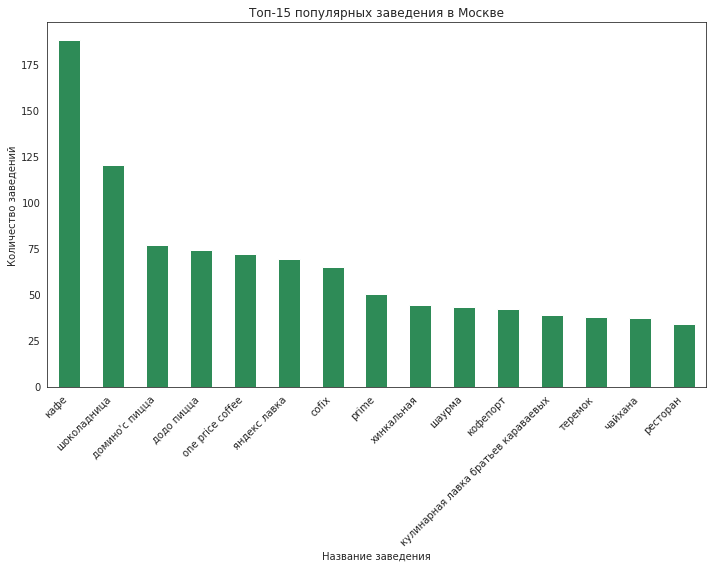

In [39]:
# Построим график
plt.figure(figsize=(10, 8))
top_names.plot(kind='bar', color='seagreen')
plt.title('Топ-15 популярных заведения в Москве')
plt.xlabel('Название заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Согласно графику, наиболее популярными названиями были: Кафе, Шоколадница(известная сеть кафе), Домино'с пицца и Додо Пицца (известные сети по доставке пиццы) и тд...Как видим, сравнительно большое количество владельцев назвали свое заведение просто "кафе".

Теперь посмотрим как обстоят дела именно с сетевыми заведениями

In [40]:
top_names2 = chains['name'].value_counts().sort_values(ascending=False).reset_index()
top_names2.columns = ['name', 'counts']
top_names2 = top_names2.head(15)

In [41]:
top_names2

,name,counts
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


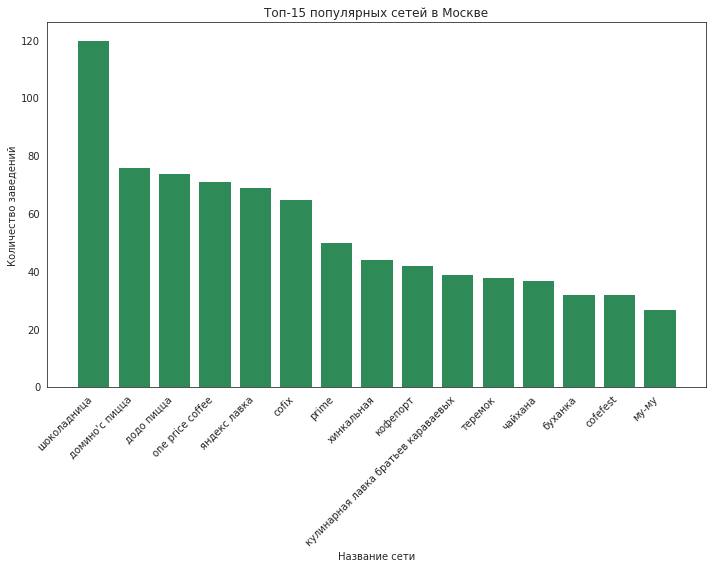

In [42]:
plt.figure(figsize=(10, 8))
plt.bar(top_names2['name'], top_names2['counts'], color='seagreen')
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Название сети')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Согласно графику, большое количество заведений у сетей: Шоколадница, Доминос пицца, Додо пицца, one price coffe, яндекс лавка и тд. Всем известные сети в Москве...

Теперь посмотрим, к каким категориям относятся эти заведения

In [43]:
#сначала отфильтруем исходные данные, только на те заведения, что находятся в топ-15
data_top_chains = data[data['name'].isin(top_names2['name'])]

In [44]:
data_top_chains

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
13,буханка,булочная,"москва, базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,базовская улица,False
23,буханка,булочная,"москва, лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,лобненская улица,False
32,додо пицца,пиццерия,"москва, коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0,коровинское шоссе,False
34,домино'с пицца,пиццерия,"москва, клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,клязьминская улица,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7973,теремок,ресторан,"москва, ореховый бульвар, 15",Южный административный округ,"ежедневно, 10:00–22:00",55.612758,37.720272,3.7,NaN,NaN,NaN,NaN,1,0.0,ореховый бульвар,False
7974,хинкальная,ресторан,"москва, улица генерала белова, 23а",Южный административный округ,"ежедневно, 12:00–00:00",55.616224,37.719993,3.6,NaN,NaN,NaN,NaN,1,60.0,улица генерала белова,False
7979,яндекс лавка,ресторан,"москва, шипиловский проезд, 65, корп. 1",Южный административный округ,"ежедневно, 07:00–00:00",55.599020,37.714239,3.5,NaN,NaN,NaN,NaN,1,75.0,шипиловский проезд,False
7980,яндекс лавка,ресторан,"москва, улица маршала захарова, 2",Южный административный округ,"ежедневно, 07:00–00:00",55.624112,37.707183,4.0,NaN,NaN,NaN,NaN,1,200.0,улица маршала захарова,False


In [45]:
#сгруппируем данные по категория и определим количество среди таких заведений
chains_top = data_top_chains['category'].value_counts().sort_values(ascending=False)

In [46]:
chains_top

кофейня            337
ресторан           186
пиццерия           152
кафе               100
булочная            25
быстрое питание     12
бар,паб              4
столовая             2
Name: category, dtype: int64

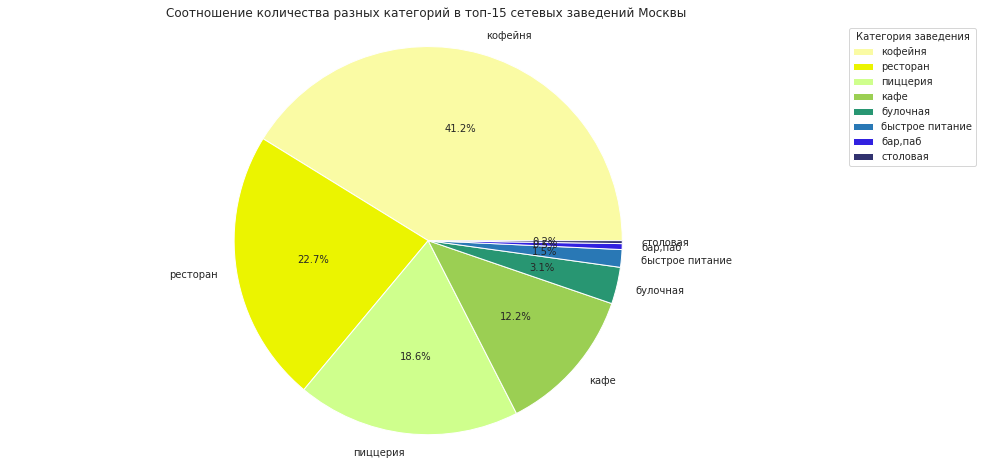

In [47]:
# Создание круговой диаграммы с легендой
plt.figure(figsize=(15, 8))
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F", '#07031A']
plt.pie(chains_top, labels=chains_top.index, autopct='%1.1f%%', colors= custom_palette)
plt.title('Соотношение количества разных категорий в топ-15 сетевых заведений Москвы')
# Задаем равные пропорции, чтобы круг выглядел как круг
plt.axis('equal') 
# Добавим легенду
plt.legend(title='Категория заведения', loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

Из представленных топ-15 заведений большинство составляют кофейни(41.2%), далее идут рестораны (22.7%) и пиццерии(18.6%). Меньше всего в топе столовых и баров.

### Оценка общего количества заведений и количества заведений каждой категории по районам. 

In [48]:
#для начала посмотрим какие административные районы Москвы есть в датасете
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Представлено всего 9 округов...

In [49]:
#посчитаем сколько заведений представлено в каждом из округов
districts = data['district'].value_counts().sort_values(ascending = False)

In [50]:
districts

Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

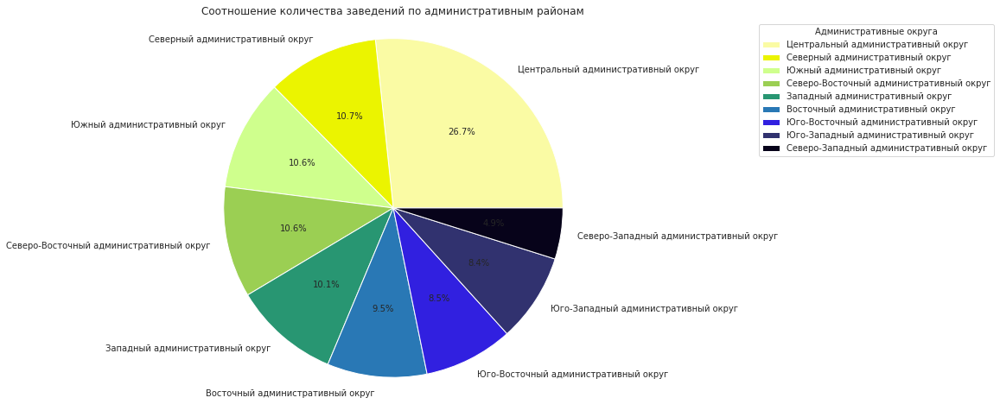

In [51]:
# Создание круговой диаграммы с легендой
plt.figure(figsize=(15, 8))
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F", '#07031A']
plt.pie(districts, labels=districts.index, autopct='%1.1f%%', colors= custom_palette)
plt.title('Соотношение количества заведений по административным районам')
# Задаем равные пропорции, чтобы круг выглядел как круг
plt.axis('equal') 
# Добавим легенду
plt.legend(title='Административные округа', loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

Ожидаемо, больше всего заведений представлено в центральном административном округе

Теперь, попробуем посмотреть сколько и какой категории заведений приходится на каждый административный округ

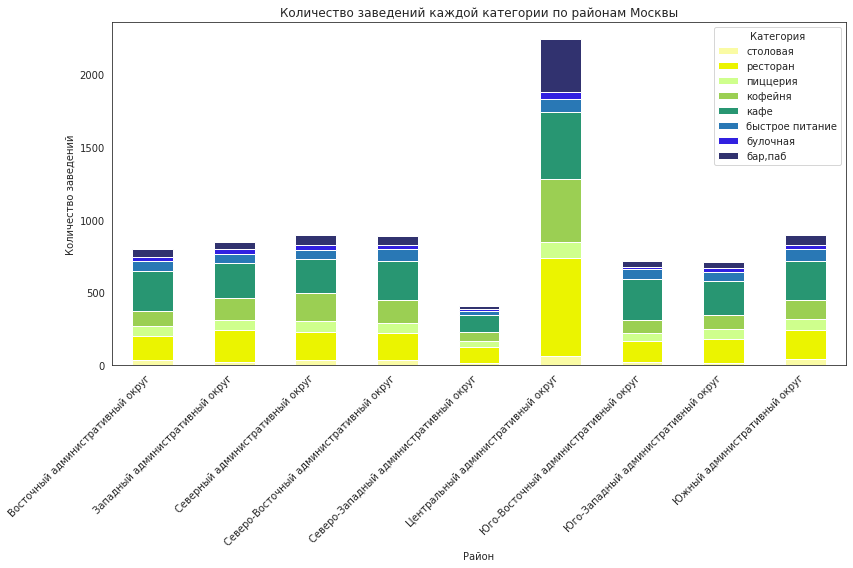

In [52]:
# Сгруппируем данные по районам и категориям, затем посчитаем количество заведений
district_category_counts = data.groupby(['district', 'category']).size().unstack(fill_value=0)
# Отсортируем столбцы в порядке возрастания
district_category_counts = district_category_counts.sort_index(axis=1, ascending=False)
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F"]
# Построим график
plt.figure(figsize=(12, 8))
# Построим столбчатую диаграмму
district_category_counts.plot(kind='bar', stacked=True, ax=plt.gca(), color=custom_palette)
# Добавим заголовок и подписи осей
plt.title('Количество заведений каждой категории по районам Москвы')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
# Выведем график на экран
plt.legend(title='Категория')
plt.tight_layout()
plt.show()

Согласно полученным данным, наибольшее количество заведений представлено в центральном административном округе, что может быть связано с большим потоком туристов и жителей, а также развитой инфраструктурой. Наименьшее количество представлено в северо-западном административном округе. Рестораны расположен в основном в центральном районе. В центральном районе популярны помимо ресторанов также кафе, кофейни и бары. В других районах в основном лидируют по количеству заведений - кафе, что может быть обусловлено их более доступной ценовой политикой и ориентацией на местных жителей.

### Распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [53]:
rating_per_cat = data.groupby('category')['rating'].agg('mean')

In [54]:
rating_per_cat

category
бар,паб            4.387696
булочная           4.268359
быстрое питание    4.050249
кафе               4.124285
кофейня            4.277282
пиццерия           4.301264
ресторан           4.290402
столовая           4.211429
Name: rating, dtype: float64

In [55]:
rating_per_cat_median = data.groupby('category')['rating'].agg('median')

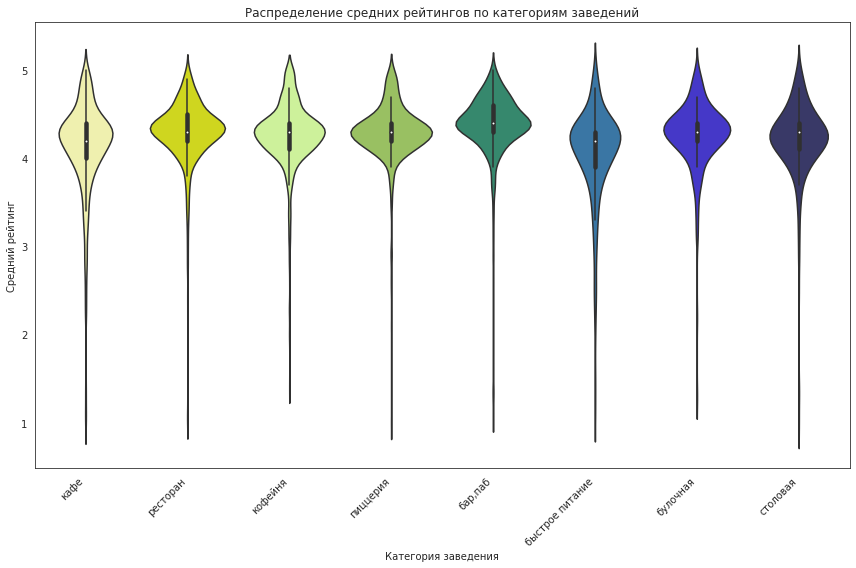

In [56]:
# Строим график violinplot средствами seaborn
plt.figure(figsize=(12, 8))
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F"]
sns.violinplot(x='category', y='rating', data=data, palette=custom_palette)
# Устанавливаем заголовок графика и подписи осей
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
# Поворачиваем подписи значений по оси X на 45 градусов для улучшения читаемости
plt.xticks(rotation=45, ha='right')
# Отображаем график
plt.tight_layout()
plt.show()

Согласно полученных данным, усредненные рейтинги в разных типах общепита варьируются от 4.05 до 4.38, различаются между собой слабо

###  Фоновая картограмму (хороплет) со средним рейтингом заведений каждого района. 

In [57]:
rating_per_distr = data.groupby('district')['rating'].agg('mean').sort_values(ascending=False)

In [58]:
rating_per_distr

district
Центральный административный округ         4.377520
Северный административный округ            4.240980
Северо-Западный административный округ     4.208802
Южный административный округ               4.184417
Западный административный округ            4.181647
Восточный административный округ           4.174185
Юго-Западный административный округ        4.172920
Северо-Восточный административный округ    4.147978
Юго-Восточный административный округ       4.101120
Name: rating, dtype: float64

In [59]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Cartodb Positron')
# создаем хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_per_distr,
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений общепита каждого района Москвы'
).add_to(m)

# выводим карту m
m

Из данных видно, что средний рейтинг заведений в Центральном административном округе выше всего (4.38), что может быть связано с более высоким уровнем сервиса, разнообразием заведений и их качеством в этом районе. Следом идут Северный административный округ и Северо-Западный административный округ с рейтингом около 4.24 и 4.21 соответственно.
Наименьший средний рейтинг заведений наблюдается в Юго-Восточном административном округе (4.10), что может указывать на более низкое качество обслуживания или менее развитую инфраструктуру в этом районе по сравнению с остальными.

### Изображение заведений общепита Москвы на карте 

In [60]:
# импортируем кластер
from folium.plugins import MarkerCluster
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Cartodb Positron')
#создаем пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
#запишем функцию, которая принимает строку датафрейма, создает маркер в текущей точке и добавляет в кластер
def create_clusters(row):
    Marker([row['lat'], row['lng']],
          popup = f"{row['name']}{row['rating']}"
          ).add_to(marker_cluster)
#применим функцию для создания маркера к записям датафрейма
data.apply(create_clusters, axis=1)
#выведем карту
m

### Топ-15 улиц по количеству заведений

Определим топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [61]:
#cuруппируем данные по улицам и подсчитываем количество заведений на каждой улице
street_counts = data['street'].value_counts().reset_index()
street_counts.columns = ['street', 'count']

In [62]:
#выбирем топ-15 улиц с наибольшим количеством заведений
top_15_streets = street_counts.head(15)

In [63]:
top_15_streets 

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [64]:
#отфильтруем исходный датасет по топ-15 улицам
data_top_15_streets = data[data['street'].isin(top_15_streets['street'])]

In [65]:
data_top_15_streets.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,дмитровское шоссе,False
12,заправка,кафе,"москва, мкад, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,мкад,False
17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,ленинградское шоссе,True
26,пикочино,пиццерия,"москва, дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,дмитровское шоссе,False
28,mafe,кафе,"москва, мкад, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,мкад,False
29,кушай город,столовая,"москва, дмитровское шоссе, 157, стр. 15",Северный административный округ,пн-пт 09:00–16:00,55.898414,37.539256,4.2,средние,Средний счёт:200–250 ₽,225.0,NaN,1,NaN,дмитровское шоссе,False
43,суши & пицца,ресторан,"москва, дмитровское шоссе, 169, корп. 6",Северо-Восточный административный округ,"ежедневно, 10:00–23:00",55.928943,37.540548,4.0,NaN,NaN,NaN,NaN,0,NaN,дмитровское шоссе,False
57,мир пиццы,кафе,"москва, дмитровское шоссе, 151, корп. 5",Северный административный округ,"ежедневно, 09:00–02:00",55.896323,37.540918,4.2,NaN,NaN,NaN,NaN,0,46.0,дмитровское шоссе,False
75,хинкали-gали!,кафе,"москва, дмитровское шоссе, 100",Северный административный округ,"ежедневно, 12:00–23:00",55.881626,37.545617,4.9,NaN,NaN,NaN,NaN,1,NaN,дмитровское шоссе,False
78,ресторан самарканд,ресторан,"москва, мкад, 82-й километр, вл18",Северо-Восточный административный округ,"ежедневно, 09:00–01:00",55.909009,37.558619,4.2,средние,Средний счёт:600 ₽,600.0,NaN,0,NaN,мкад,False


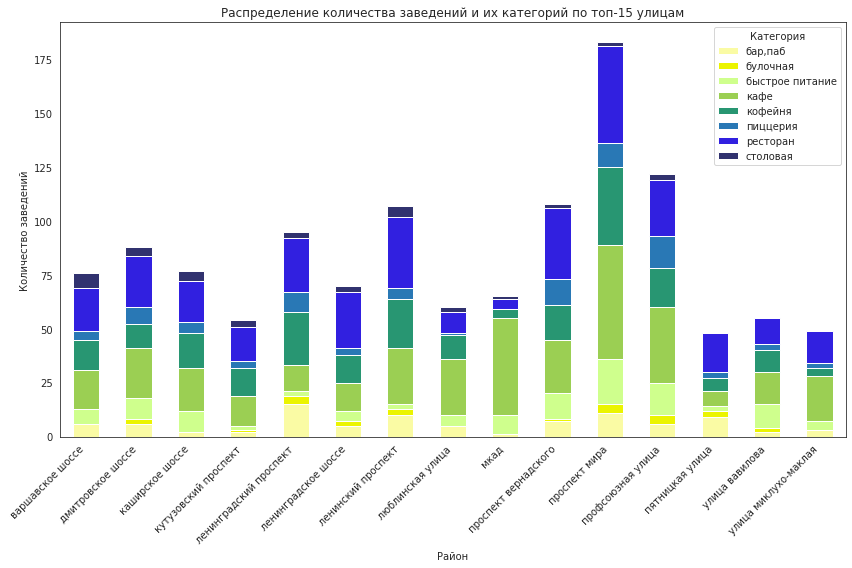

In [66]:
# Сгруппируем данные по районам и категориям, затем посчитаем количество заведений
street_category_top15 = data_top_15_streets.groupby(['street', 'category']).size().unstack(fill_value=0)
# Отсортируем столбцы в порядке возрастания
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F"]
# Построим график
plt.figure(figsize=(12, 8))
# Построим столбчатую диаграмму
street_category_top15.plot(kind='bar', stacked=True, ax=plt.gca(), color=custom_palette)
# Добавим заголовок и подписи осей
plt.title('Распределение количества заведений и их категорий по топ-15 улицам')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
# Выведем график на экран
plt.legend(title='Категория')
plt.tight_layout()
plt.show()

Из представленных данных можно сделать следующие выводы:
Улица "проспект Мира" является лидером по количеству заведений общественного питания среди топ-15 улиц по количеству заведений. На ней находится больше всего разнообразных заведений.
"Ленинский проспект" и "Профсоюзная улица" также имеют высокое количество заведений, превышающее 100. Это может быть связано с тем, что эти улицы проходят через различные районы города и имеют большой пешеходный и автомобильный трафик.
Категория "кафе" преобладает на большинстве улиц, за исключением некоторых, где "рестораны" также имеют высокое количество заведений.
Улица "Кутузовский проспект" имеет большое количество ресторанов и кафе, что может быть связано с его географическим расположением и тем, что это одна из основных магистралей города.
Некоторые улицы, такие как "улица Миклухо-Маклая" и "улица Вавилова", имеют меньшее количество заведений по сравнению с другими улицами в топ-15, что может быть обусловлено их меньшей протяженностью или меньшей популярностью среди предпринимателей.

### Улицы, на которых находится только один объект общепита.

In [67]:
# Найдем улицы только с одним объектом общепита
streets = data['street'].value_counts().reset_index()
streets.columns = ['street', 'count']

In [68]:
streets.tail(10)

,street,count
1437,улица речников,1
1438,полоцкая улица,1
1439,зоологическая улица,1
1440,мансуровский переулок,1
1441,улица пивченкова,1
1442,игарский проезд,1
1443,промышленный проезд,1
1444,улица неверовского,1
1445,конюшковская улица,1
1446,улица всеволода вишневского,1


In [69]:
streets_with_one_place= streets[streets['count'] == 1]

In [70]:
# выведем список таких улиц
streets_with_one_place

,street,count
990,2-й верхний михайловский проезд,1
991,14-я парковая улица,1
992,орловский переулок,1
993,парк технических видов спорта,1
994,парк этнографическая деревня бибирево,1
...,...,...
1442,игарский проезд,1
1443,промышленный проезд,1
1444,улица неверовского,1
1445,конюшковская улица,1


Найдено 469 таких улиц

In [71]:
data_1_place = data[data['street'].isin(streets_with_one_place['street'])]

In [72]:
data_1_place

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,мираж,ресторан,"москва, улица шкулёва, 2а",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица шкулёва,False
8294,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица артюхиной,False
8317,беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,кузьминская улица,False
8379,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,новороссийская улица,False


Выведем на карту полученные заведения

In [73]:
# импортируем кластер
from folium.plugins import MarkerCluster
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Cartodb Positron')
#создаем пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
#запишем функцию, которая принимает строку датафрейма, создает маркер в текущей точке и добавляет в кластер
def create_clusters(row):
    Marker([row['lat'], row['lng']],
          popup = f"{row['name']}{row['rating']}"
          ).add_to(marker_cluster)
#применим функцию для создания маркера к записям датафрейма
data_1_place.apply(create_clusters, axis=1)
#выведем карту
m

Посмотрим, что можно сказать об этих заведениях, расположенных на представленных улицах

Для этого попробуем посмотреть, что за заведения расположены на этих улицах

In [74]:
#сгруппируем данные по категориям 
category_1_place = data_1_place['category'].value_counts().sort_values(ascending=False)

In [75]:
category_1_place

кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

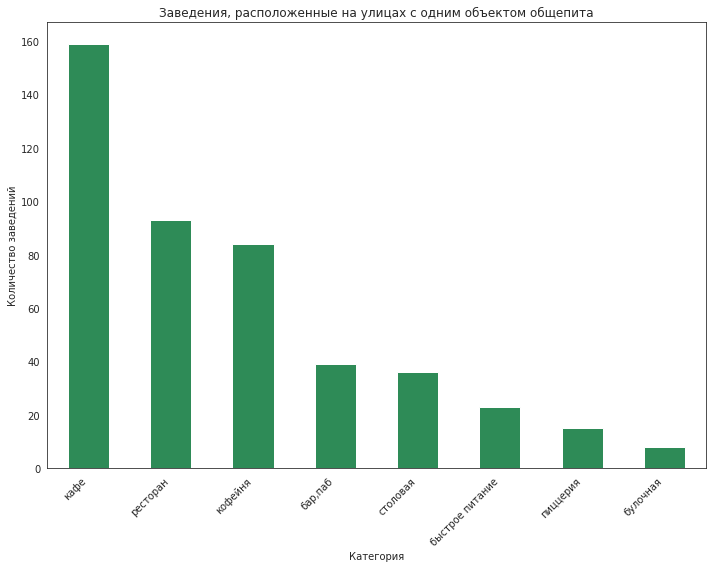

In [76]:
# Построим график
plt.figure(figsize=(10, 8))
category_1_place.plot(kind='bar', color='seagreen')
plt.title('Заведения, расположенные на улицах с одним объектом общепита')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

На улицах, где расположено только одно заведение общепита, представлены различные типы заведений, включая кафе, рестораны, кофейни, бары, пабы, столовые, быстрое питание, пиццерии и булочные. Наибольшее количество заведений на таких улицах относится к категории кафе. Это может быть связано с тем, что кафе являются одним из наиболее распространенных и востребованных типов заведений, обладающих широким спектром услуг и меню. Рестораны и кофейни также представлены на этих улицах в значительном количестве. Рестораны могут привлекать посетителей как для обедов и ужинов, так и для проведения различных мероприятий, в то время как кофейни могут быть популярными местами для завтраков, перекусов и встреч с друзьями.

In [77]:
# Сгруппируем данные по районам и категориям, затем посчитаем количество заведений
district_category_1place = data_1_place.groupby(['district', 'category']).size().unstack(fill_value=0)

In [78]:
district_category_1place

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,2,0,7,18,7,6,7,5
Западный административный округ,4,2,3,13,2,2,8,1
Северный административный округ,2,2,1,19,13,1,7,6
Северо-Восточный административный округ,2,0,3,16,10,3,14,7
Северо-Западный административный округ,1,0,1,4,3,0,8,2
Центральный административный округ,23,2,3,38,34,2,36,7
Юго-Восточный административный округ,5,0,1,20,6,1,4,2
Юго-Западный административный округ,0,1,2,9,4,0,1,1
Южный административный округ,0,1,2,22,5,0,8,5


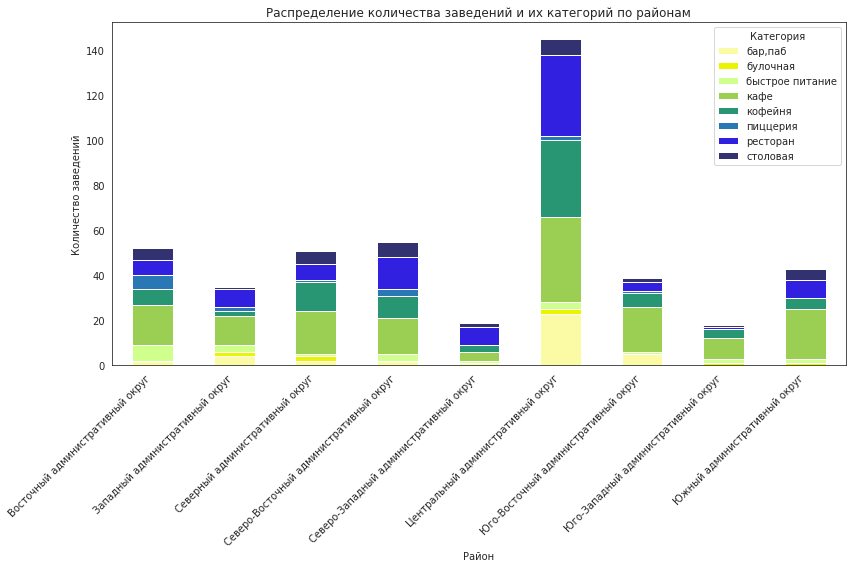

In [79]:
# Сгруппируем данные по районам и категориям, затем посчитаем количество заведений
district_category_1place = data_1_place.groupby(['district', 'category']).size().unstack(fill_value=0)
# Отсортируем столбцы в порядке возрастания
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F"]
# Построим график
plt.figure(figsize=(12, 8))
# Построим столбчатую диаграмму
district_category_1place.plot(kind='bar', stacked=True, ax=plt.gca(), color=custom_palette)
# Добавим заголовок и подписи осей
plt.title('Распределение количества заведений и их категорий по районам')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
# Выведем график на экран
plt.legend(title='Категория')
plt.tight_layout()
plt.show()

Больше всего таких улиц, где расположено только одно заведение представлены в центральном, северо-восточном, северном и восточном административных округах. Меньше всего - в северо-западном и юго-западном административных округах. В разных административных округах Москвы наблюдается различное количество заведений различных категорий. Например, в центральном административном округе преобладают кафе и рестораны, в то время как в других округах, таких как Восточный и Юго-Восточный, также значительное количество заведений быстрого питания и столовых.

### Определение медианы среднего чека заведений для каждого района. 

Найдем медиану среднего чека заведений для каждого района.

In [80]:
#сгруппируем данные по району и найдем медиану среднего чека заведения 
median_bill = data.groupby('district')['middle_avg_bill'].agg('median').sort_values(ascending=False)

In [81]:
#выведем на экран
median_bill

district
Западный административный округ            1000.0
Центральный административный округ         1000.0
Северо-Западный административный округ      700.0
Северный административный округ             650.0
Юго-Западный административный округ         600.0
Восточный административный округ            575.0
Северо-Восточный административный округ     500.0
Южный административный округ                500.0
Юго-Восточный административный округ        450.0
Name: middle_avg_bill, dtype: float64

Построим график "ящик с усами", чтобы увидеть, до каких рамок эти значения могут изменяться.

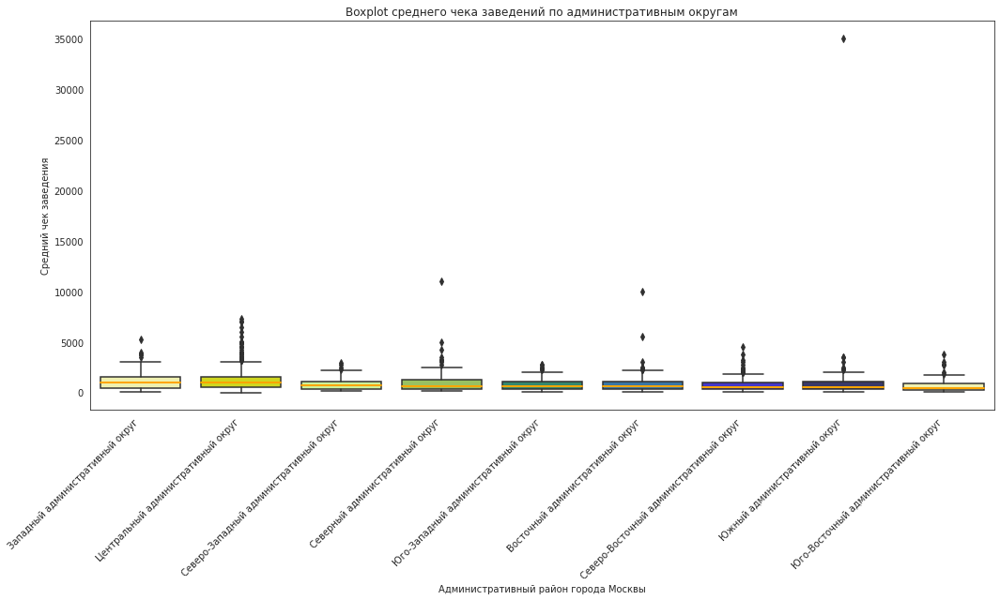

In [82]:
plt.figure(figsize=(15, 9))
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F"]
sns.boxplot(x='district', y='middle_avg_bill', data=data, order=median_bill.index, 
            palette=custom_palette, medianprops={'color': 'orange', 'linewidth': 2})
plt.title('Boxplot среднего чека заведений по административным округам')
plt.xlabel('Административный район города Москвы')
plt.ylabel('Средний чек заведения')
plt.xticks(rotation=45, ha='right')
# Выведем график на экран
plt.tight_layout()
plt.show()

In [83]:
filtered_median_bill= data[data['middle_avg_bill']<1000]

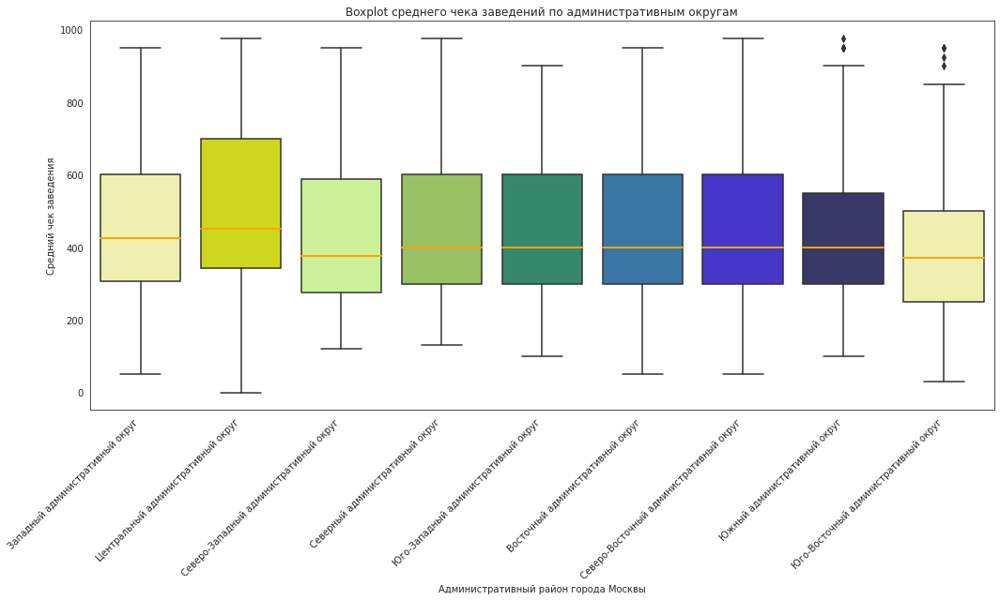

In [84]:
plt.figure(figsize=(15, 9))
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F"]
sns.boxplot(x='district', y='middle_avg_bill', data=filtered_median_bill, order=median_bill.index, 
            palette=custom_palette, medianprops={'color': 'orange', 'linewidth': 2})
plt.title('Boxplot среднего чека заведений по административным округам')
plt.xlabel('Административный район города Москвы')
plt.ylabel('Средний чек заведения')
plt.xticks(rotation=45, ha='right')
# Выведем график на экран
plt.tight_layout()
plt.show()

In [85]:
data.groupby('district')['middle_avg_bill'].describe()

,count,mean,std,min,25%,50%,75%,max
district,,,,,,,,
Восточный административный округ,260.0,820.626923,850.903310,50.0,338.00,575.0,1100.0,10000.0
Западный административный округ,306.0,1053.225490,779.008536,50.0,427.50,1000.0,1500.0,5250.0
Северный административный округ,322.0,927.959627,912.609221,130.0,350.00,650.0,1250.0,11000.0
Северо-Восточный административный округ,301.0,716.611296,591.232153,50.0,325.00,500.0,950.0,4500.0
Северо-Западный административный округ,157.0,822.222930,595.055218,120.0,340.00,700.0,1100.0,2900.0
Центральный административный округ,1060.0,1191.057547,920.014707,0.0,500.00,1000.0,1500.0,7250.0
Юго-Восточный административный округ,194.0,654.097938,566.825663,30.0,281.25,450.0,887.5,3750.0
Юго-Западный административный округ,235.0,792.561702,559.173122,100.0,350.00,600.0,1100.0,2750.0
Южный административный округ,314.0,834.398089,2008.640596,100.0,350.00,500.0,1037.5,35000.0


Наибольшая медиана среднего чека наблюдается в центральном административном округе (1000), что может указывать на более высокий уровень цен и стоимости обслуживания в этом районе.
Значительные различия в медиане среднего чека можно заметить между различными округами, что может свидетельствовать о разной платежеспособности жителей и различиях в предпочтениях потребителей. Низкие значения медианы в Юго-Восточном и Южном административных округах (450 и 500 соответственно) могут указывать на более доступные цены на услуги общественного питания в этих районах.
Кроме медианы, также стоит обратить внимание на наличие больших выбросов в данных о среднем чеке заведений для каждого района. Большие выбросы могут быть индикатором наличия в районе каких-то особых условий или заведений с очень высокими ценами, которые сильно влияют на общий статистический показатель.
Например, в Южном административном округе обнаруживается медианное значение среднего чека в 500, но при этом есть значительный разброс данных, включая выбросы вроде 35000. Это может указывать на наличие каких-то роскошных заведений или ресторанов с очень высокими ценами на услуги.
Такие большие выбросы следует учитывать при анализе, так как они могут существенно искажать общую картину и влиять на принятие решений о размещении нового заведения. Либо, как вариант избавиться от таких значений

Далее построим фоновую картограмму (хороплет) с полученными значениями медианы среднего чека для каждого района

In [86]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Cartodb Positron')
# создаем хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений общепита каждого района Москвы'
).add_to(m)

# выводим карту m
m

### Вывод

В результате анализа данных о заведениях общественного питания в Москве можно выделить несколько ключевых наблюдений.
- Наиболее распространёнными категориями заведений являются кафе, рестораны и кофейни. Это может быть обусловлено спросом на подобные заведения среди москвичей и туристов, а также их разнообразием и адаптацией к различным потребностям посетителей.
- В заведениях таких категорий, как рестораны, бары и кофейни, обычно предоставляется большее количество посадочных мест, по сравнению с пиццериями и булочными. Это связано с тем, что в ресторанах и барах клиенты могут проводить длительное время, ужинать или отдыхать, в то время как пиццерии и булочные чаще предлагают еду на вынос или доставку.
- В датасете преобладают несетевые заведения (около 61.9% от общего числа), однако доля сетевых заведений (около 38.1%) также значительна. Среди сетевых заведений чаще всего встречаются кафе, рестораны и кофейни, в то время как столовых и булочных сетей намного меньше.
- Из анализа названий заведений выявлены топ-15 популярных сетей в Москве, такие как "Шоколадница", "Доминос Пицца", "Додо Пицца" и другие. Эти сети обычно имеют большое количество филиалов и пользуются широкой популярностью среди жителей и гостей города.
- Наибольшее количество заведений общественного питания сконцентрировано в центральном административном округе, что объясняется высокой плотностью населения, развитой инфраструктурой и туристическими объектами. Другие районы также представлены, однако с меньшим количеством заведений.
- Средний чек в заведениях общественного питания варьируется в зависимости от района. Наибольшие средние чеки наблюдаются в центральных и западных районах, в то время как в северо-восточных, южных и юго-западных районах цены значительно ниже. Это может быть обусловлено различиями в уровне доходов жителей, стоимостью аренды помещений и общим уровнем цен в различных районах города.

В целом, анализ данных позволяет понять основные тенденции и характеристики рынка общественного питания в Москве, что может быть полезно как для предпринимателей, планирующих открыть новое заведение, так и для потенциальных посетителей, выбирающих место для посещения.

## Детализация исследования: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

Для этого попробуем ответить на такие вопросы, как:
- Сколько всего кофеен в датасете? 
- В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

### Общие данные о кофейнях, представленных в датасете

Для начала отфильтруем исходный датасет только на данные о кофейнях

In [87]:
cafe = data[data['category']=='кофейня']

In [88]:
#выведем полученный датасет на экран
cafe

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,люблинская улица,False
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,волгоградский проспект,False
8376,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,грайвороновская улица,False
8385,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,новохохловская улица,False


In [89]:
#определим количество кофейн, представленных в датасете
len(cafe)

1413

Всего 1413 кофейн представлено в датасете

Выведем их расположение на экран

In [90]:
# импортируем кластер
from folium.plugins import MarkerCluster
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Cartodb Positron')
#создаем пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
#запишем функцию, которая принимает строку датафрейма, создает маркер в текущей точке и добавляет в кластер
def create_clusters(row):
    Marker([row['lat'], row['lng']],
          popup = f"{row['name']}{row['rating']}"
          ).add_to(marker_cluster)
#применим функцию для создания маркера к записям датафрейма
cafe.apply(create_clusters, axis=1)
#выведем карту
m

### Расположение кофеен по районам г. Москвы

In [91]:
cafe_district = cafe['district'].value_counts().sort_values(ascending=False)

In [92]:
cafe_district 

Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: district, dtype: int64

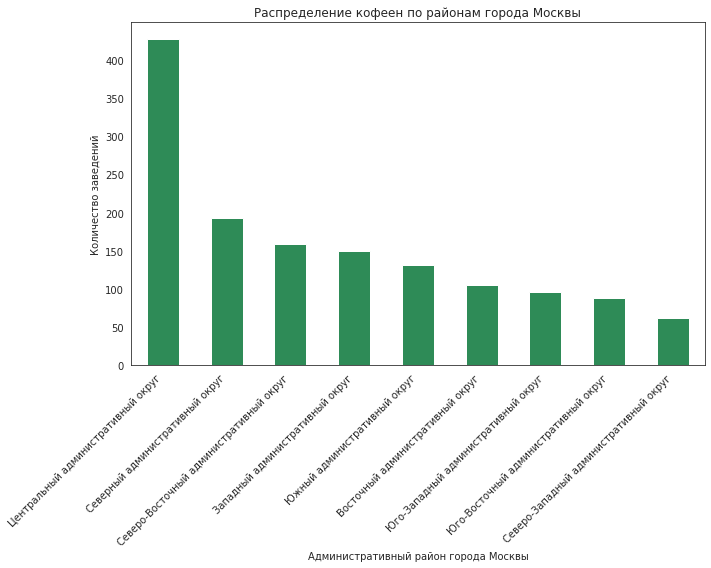

In [93]:
# Построим график
plt.figure(figsize=(10, 8))
cafe_district .plot(kind='bar', color='seagreen')
plt.title('Распределение кофеен по районам города Москвы')
plt.xlabel('Административный район города Москвы')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Как видим, наибольшее количество кофеен представлено в центральном, северном, северо-восточном и западном административных округах. Наименьшее - в юго-восточном и северо-западном округе.

### Наличие круглосуточных кофеен

Определим, есть ли круглосуточные заведения среди кофеен

In [94]:
cafe_24_7 = cafe[cafe['is_24_7']==True]

In [95]:
cafe_24_7

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,дмитровское шоссе,True
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,ярославское шоссе,True
1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,ярославское шоссе,True
1214,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,мкад,True
1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица народного ополчения,True
1468,кофе хауз,кофейня,"москва, ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,1,NaN,ленинградский проспект,True
1790,кофемания,кофейня,"москва, ленинградский проспект, 37а, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,1,15.0,ленинградский проспект,True
1825,you&coffee,кофейня,"москва, улица золоторожский вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,1,NaN,улица золоторожский вал,True
1883,кофемания,кофейня,"москва, лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,140.0,лесная улица,True
2030,cinnabon,кофейня,"москва, долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,1,230.0,долгоруковская улица,True


In [96]:
#Посчитаем сколько таких кофеен
len(cafe_24_7)

59

Таких кофеен всего 59

Посмотрим в каких районах представлены кофейни, работающие в режиме 24/7

In [97]:
district_cafe24_7 = cafe_24_7['district'].value_counts().sort_values(ascending=False)

In [98]:
district_cafe24_7

Центральный административный округ         26
Западный административный округ             9
Юго-Западный административный округ         7
Восточный административный округ            5
Северный административный округ             5
Северо-Восточный административный округ     3
Северо-Западный административный округ      2
Южный административный округ                1
Юго-Восточный административный округ        1
Name: district, dtype: int64

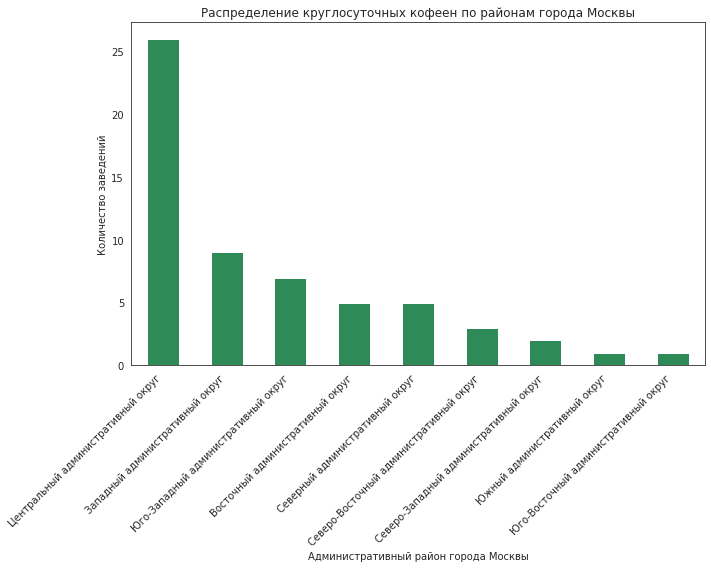

In [99]:
# Построим график
plt.figure(figsize=(10, 8))
district_cafe24_7.plot(kind='bar', color='seagreen')
plt.title('Распределение круглосуточных кофеен по районам города Москвы')
plt.xlabel('Административный район города Москвы')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Полученные результаты показывают, что наибольшее количество кофеен, работающих в режиме 24/7, сосредоточено в центральном административном округе Москвы, что может быть связано с высоким спросом на кофе и другие напитки в этом центральном районе, где активная ночная жизнь и многочисленные туристические точки привлекают посетителей круглосуточно.
Западный административный округ также имеет значительное количество 24/7 кофеен, что может быть связано с его развитой инфраструктурой и наличием деловых центров.
Другие районы имеют значительно меньшее количество таких кофеен.

### Определим, какие у кофеен рейтинги? Как они распределяются по районам?

In [100]:
rating_cafe= cafe.groupby('district')['rating'].agg('mean')

In [101]:
rating_cafe

district
Восточный административный округ           4.282857
Западный административный округ            4.195333
Северный административный округ            4.291710
Северо-Восточный административный округ    4.216981
Северо-Западный административный округ     4.325806
Центральный административный округ         4.336449
Юго-Восточный административный округ       4.225843
Юго-Западный административный округ        4.283333
Южный административный округ               4.232824
Name: rating, dtype: float64

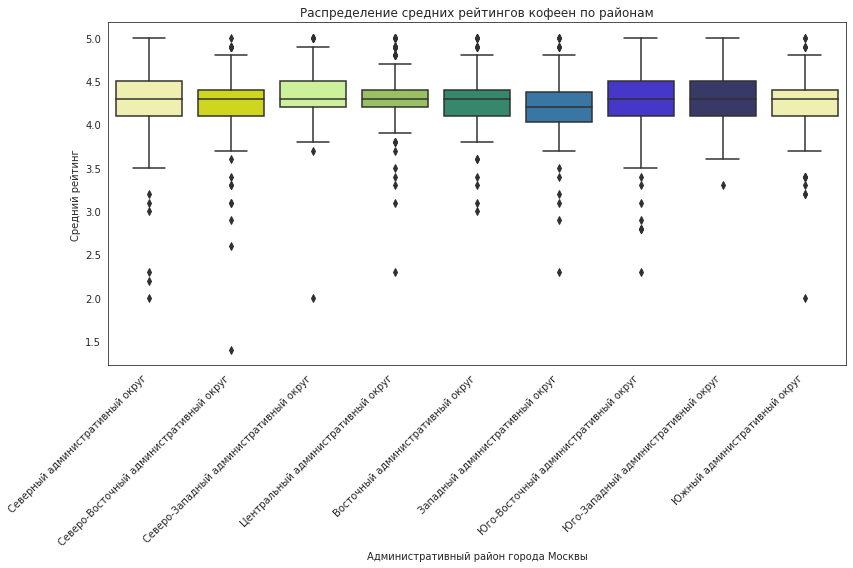

In [102]:
# Строим график средствами seaborn
plt.figure(figsize=(12, 8))
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F"]
sns.boxplot(x='district', y='rating', data=cafe, palette=custom_palette)
# Устанавливаем заголовок графика и подписи осей
plt.title('Распределение средних рейтингов кофеен по районам')
plt.xlabel('Административный район города Москвы')
plt.ylabel('Средний рейтинг')
# Поворачиваем подписи значений по оси X на 45 градусов для улучшения читаемости
plt.xticks(rotation=45, ha='right')
# Отображаем график
plt.tight_layout()
plt.show()

Из представленных данных можно сделать следующие наблюдения.В среднем рейтинг кофеен выше 4.2 по шкале от 1 до 5 во всех административных округах Москвы, что свидетельствует о достаточно высоком качестве обслуживания. Самый высокий средний рейтинг у кофеен в Центральном административном округе (4.34), что, вероятно, связано с их расположением в центре города и большим потоком посетителей.Наименьший разброс в рейтингах наблюдается в Центральном административном округе, где стандартное отклонение составляет 0.26, что указывает на более однородное качество кофеен в этом районе. В Западном административном округе замечен самый маленький среди других округов рейтинг, что может быть связано с различными факторами, такими как низкое качество обслуживания, неудовлетворительное качество продукции или неудачное расположение.
Большинство кофеен во всех административных округах имеют рейтинг от 4.1 до 4.4, что свидетельствует о достаточно стабильном качестве обслуживания и продукции.

In [103]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Cartodb Positron')
# создаем хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cafe,
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений общепита каждого района Москвы'
).add_to(m)

# выводим карту m
m

### Среднее количество посадочных мест у кофеен по районам города Москвы

In [104]:
cafe_seats = cafe.groupby('district')['seats'].agg('median').sort_values(ascending=False)

In [105]:
cafe_seats

district
Западный административный округ            96.0
Северо-Западный административный округ     87.5
Центральный административный округ         86.0
Южный административный округ               80.0
Северо-Восточный административный округ    75.0
Северный административный округ            66.0
Юго-Западный административный округ        64.5
Восточный административный округ           55.0
Юго-Восточный административный округ       50.0
Name: seats, dtype: float64

In [106]:
cafe_seats_mean = cafe.groupby('district')['seats'].agg('mean').sort_values(ascending=False)

In [107]:
cafe_seats_mean

district
Западный административный округ            153.329670
Южный административный округ               124.973333
Северный административный округ            117.281818
Центральный административный округ         113.146789
Восточный административный округ            97.444444
Северо-Восточный административный округ     92.132530
Северо-Западный административный округ      87.352941
Юго-Западный административный округ         86.607143
Юго-Восточный административный округ        70.923077
Name: seats, dtype: float64

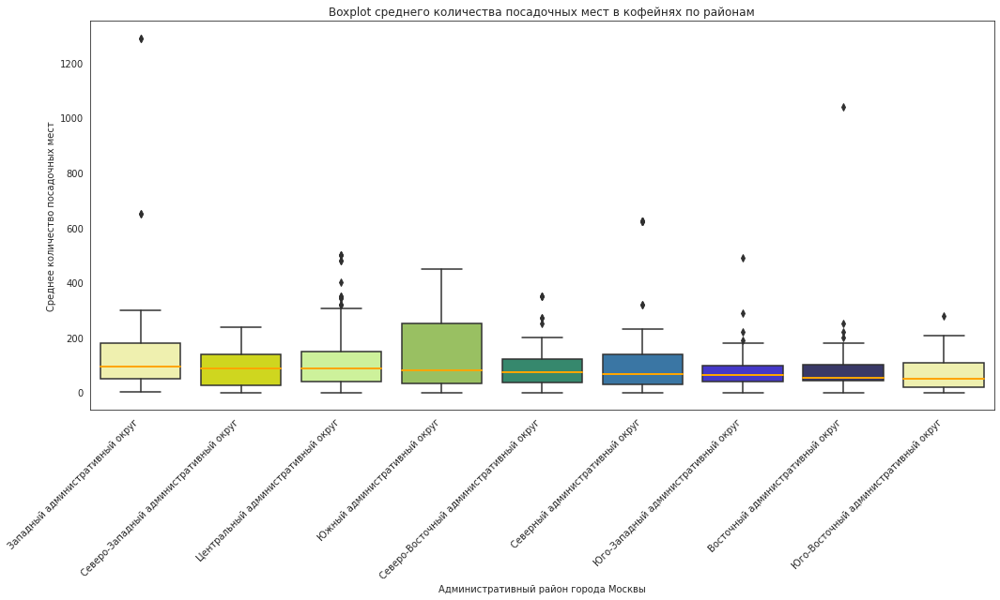

In [108]:
#построим график "ящик с усами"
plt.figure(figsize=(15, 9))
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F"]
sns.boxplot(x='district', y='seats', data=cafe, order=cafe_seats.index, 
            palette=custom_palette, medianprops={'color': 'orange', 'linewidth': 2})
plt.title('Boxplot среднего количества посадочных мест в кофейнях по районам')
plt.xlabel('Административный район города Москвы')
plt.ylabel('Среднее количество посадочных мест')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Из полученных данных видно, что среднее количество посадочных мест в кофейнях различается в зависимости от административного округа Москвы. Наибольшее среднее количество посадочных мест наблюдается в Западном административном округе, Центральном административном округе и Северо-западном административном округе. Наименьшее среднее количество посадочных мест характерно для Юго-Восточного административного округа, Юго-Западного и Юго-Восточного административного округа. На графике "Boxplot" видно, что в большинстве районов есть значительный разброс значений количества посадочных мест, что может свидетельствовать о разнообразии по размерам и форматам кофейных заведений. Медианные значения количества посадочных мест также варьируются в разных районах. Например, они находятся в диапазоне от 50 до 96 мест для различных округов. Исходя из этих данных, можно сделать предположения о предпочтениях жителей и особенностях развития кофейной индустрии в каждом районе Москвы. Например, в центральных и западных районах, где количество посадочных мест выше, возможно, больше разнообразие заведений и больше предпочтений у посетителей. В то время как в менее центральных районах может быть более специфическая аудитория или другие факторы, влияющие на размеры кофейных заведений.

### Средний чек у заведений типа кофейни по районам города Москвы

In [109]:
#сгруппируем данные по району и найдем медиану среднего чека заведения 
cafe_median_bill = cafe.groupby('district')['middle_avg_bill'].agg('median').sort_values(ascending=False)

In [110]:
cafe_median_bill

district
Западный административный округ            600.0
Центральный административный округ         500.0
Восточный административный округ           400.0
Южный административный округ               387.5
Юго-Западный административный округ        375.0
Северный административный округ            325.0
Северо-Восточный административный округ    325.0
Северо-Западный административный округ     325.0
Юго-Восточный административный округ       250.0
Name: middle_avg_bill, dtype: float64

Построим график "ящик с усами" чтобы понять до каких значений они могут измениться

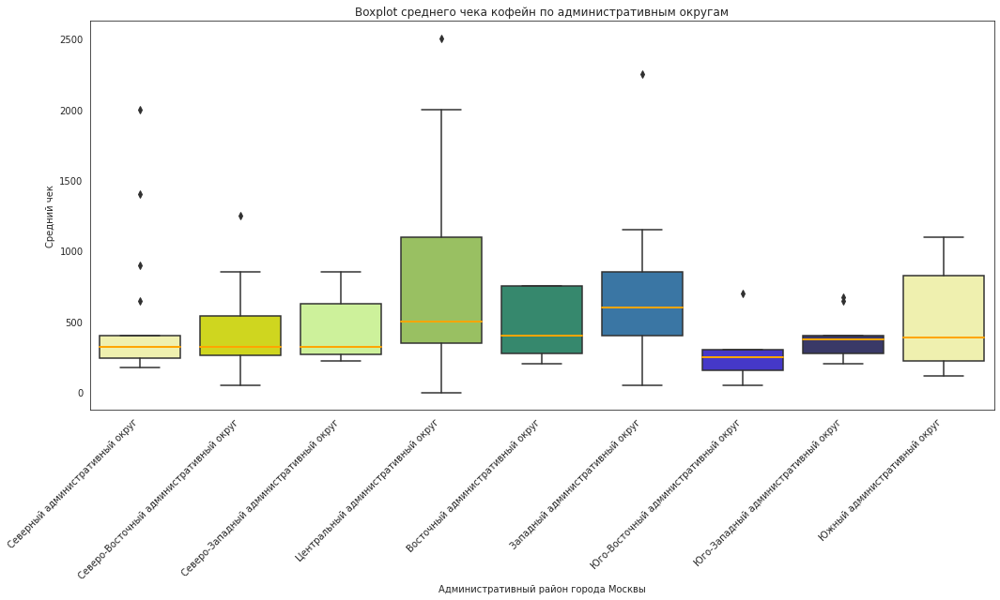

In [111]:
plt.figure(figsize=(15, 9))
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F"]
sns.boxplot(x='district', y='middle_avg_bill', data=cafe,  
            palette=custom_palette, medianprops={'color': 'orange', 'linewidth': 2})
plt.title('Boxplot среднего чека кофейн по административным округам')
plt.xlabel('Административный район города Москвы')
plt.ylabel('Средний чек')
plt.xticks(rotation=45, ha='right')
# Выведем график на экран
plt.tight_layout()
plt.show()

In [112]:
cafe.groupby('district')['middle_avg_bill'].describe()

,count,mean,std,min,25%,50%,75%,max
district,,,,,,,,
Восточный административный округ,9.0,486.111111,244.665304,200.0,275.00,400.0,750.0,750.0
Западный административный округ,18.0,694.444444,490.839284,50.0,400.00,600.0,850.0,2250.0
Северный административный округ,19.0,495.736842,467.674251,175.0,239.50,325.0,400.0,2000.0
Северо-Восточный административный округ,19.0,433.157895,286.236162,50.0,265.00,325.0,537.5,1250.0
Северо-Западный административный округ,11.0,440.636364,234.862629,225.0,267.50,325.0,625.0,850.0
Центральный административный округ,85.0,794.764706,605.567869,0.0,350.00,500.0,1100.0,2500.0
Юго-Восточный административный округ,10.0,263.000000,175.011111,50.0,156.25,250.0,300.0,700.0
Юго-Западный административный округ,11.0,381.818182,158.149814,200.0,275.00,375.0,400.0,675.0
Южный административный округ,18.0,504.777778,325.368127,120.0,222.50,387.5,825.0,1100.0


Из этого анализа можно сделать вывод о том, что средний чек в кофейнях может существенно различаться в зависимости от района. Например, кофейные заведения в Западном административном округе имеют более высокие цены, чем в других районах, в то время как в Юго-Восточном административном округе средний чек значительно ниже. Эти различия могут быть обусловлены уровнем доходов жителей района, ценовой политикой заведений и другими факторами.

### Средняя стоимость чашки капучино в кофейнях в районах города Москвы

In [113]:
medium_cup = cafe.groupby('district')['middle_coffee_cup'].agg('median').sort_values(ascending=False)

In [114]:
medium_cup

district
Юго-Западный административный округ        198.0
Центральный административный округ         190.0
Западный административный округ            189.0
Северо-Западный административный округ     165.0
Северо-Восточный административный округ    162.5
Северный административный округ            159.0
Южный административный округ               150.0
Юго-Восточный административный округ       147.5
Восточный административный округ           135.0
Name: middle_coffee_cup, dtype: float64

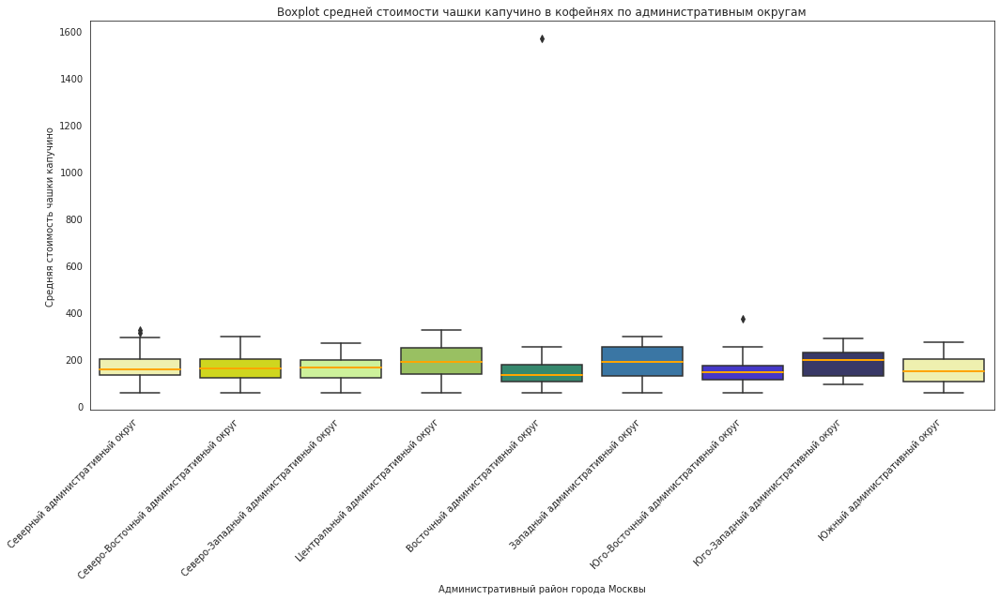

In [115]:
plt.figure(figsize=(15, 9))
custom_palette  = ['#FAFBA4', '#EBF400', "#CFFF8D", "#9BCF53", "#289672", "#2978B5", "#3120E0", "#31326F"]
sns.boxplot(x='district', y='middle_coffee_cup', data=cafe,  
            palette=custom_palette, medianprops={'color': 'orange', 'linewidth': 2})
plt.title('Boxplot средней стоимости чашки капучино в кофейнях по административным округам')
plt.xlabel('Административный район города Москвы')
plt.ylabel('Средняя стоимость чашки капучино')
plt.xticks(rotation=45, ha='right')
# Выведем график на экран
plt.tight_layout()
plt.show()

In [116]:
cafe.groupby('district')['middle_coffee_cup'].describe()

,count,mean,std,min,25%,50%,75%,max
district,,,,,,,,
Восточный административный округ,42.0,174.023810,225.384710,60.0,106.25,135.0,177.50,1568.0
Западный административный округ,49.0,189.938776,74.227243,60.0,130.00,189.0,256.00,300.0
Северный административный округ,76.0,165.789474,62.668081,60.0,133.00,159.0,204.25,325.0
Северо-Восточный административный округ,60.0,165.333333,63.644049,60.0,123.00,162.5,201.25,297.0
Северо-Западный административный округ,21.0,165.523810,60.797713,60.0,124.00,165.0,200.00,270.0
Центральный административный округ,162.0,187.518519,67.263201,60.0,139.00,190.0,250.00,328.0
Юго-Восточный административный округ,34.0,151.088235,62.421523,60.0,112.50,147.5,173.75,375.0
Юго-Западный административный округ,34.0,184.176471,57.536007,95.0,129.00,198.0,229.25,291.0
Южный административный округ,43.0,158.488372,66.133117,60.0,107.50,150.0,202.50,275.0


In [117]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Cartodb Positron')
# создаем хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=medium_cup,
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name=' Средняя стоимость чашки капучино в кофейнях в районах города Москвы'
).add_to(m)

# выводим карту m
m

Из полученных данных видно, что средняя стоимость чашки капучино в кофейнях различается в зависимости от административного округа Москвы.Самая высокая средняя стоимость чашки капучино наблюдается в Юго-Западном, Центральном и Западном  административном округе. Это может быть связано с тем, что эти районы имеют более высокий уровень жизни и, следовательно, более высокие цены на недвижимость и аренду помещений для кофеен.
Самая низкая средняя стоимость чашки капучино зарегистрирована в Восточном и Юго-Восточном административном округе. Эти районы могут иметь более низкий уровень доходов населения, что отражается на ценах в кофейнях.
При открытии новой кофейни можно использовать медианную стоимость чашки кофе для каждого региона. Медиана предлагает статистическую меру, которая отражает цену, на которую приходится половина наблюдений. 
В этом случае рекомендации по медианной стоимости чашки капучино для каждого района будут следующими:1) Восточный административный округ 135.2) Западный административный округ 189. 3) Северный административный округ 159. 4) Северо-Восточный административный округ 162. 5) Северо-Западный административный округ 165. 6) Центральный административный округ 190. 5) Юго-Восточный административный округ 147.5. 7) Юго-Западный административный округ 198. 7) Южный административный округ 150.
Ориентирование на медианную стоимость позволит учесть центральную тенденцию распределения цен и предложить конкурентоспособные цены для новой кофейни в каждом районе.

## Вывод

В результате анализа кофеен, представленных в датасете были получены следующие выводы:

- В датасете представлено 1413 кофеен.
- Больше всего кофеен представлено в центральном, северном и северо-восточном районах Москвы. Это может свидетельствовать о большом спросе на кофе в этих районах или о более благоприятной бизнес-среде для открытия кофейных заведений.
- Из 1413 кофеен только 59 работают круглосуточно. Это означает, что есть спрос на круглосуточные кофейни, но они представлены в небольшом количестве.
- Средний рейтинг кофеен выше 4.2 во всех административных округах Москвы, что указывает на достаточно высокое качество обслуживания. Самый высокий средний рейтинг у кофеен в Центральном административном округе (4.34), что может свидетельствовать о высокой конкуренции и спросе на кофе в этом районе.
-  Средняя стоимость чашки капучино в разных районах колеблется от 151 до 190 рублей. Ориентироваться на цену при открытии новой кофейни следует исходя из конкурентной среды в районе, целевой аудитории и затрат на обслуживание.
-  Средний чек в кофейнях может существенно различаться в зависимости от района. Например, кофейные заведения в Западном административном округе имеют более высокие цены, чем в других районах, в то время как в Юго-Восточном административном округе средний чек значительно ниже. Различия в среднем чеке могут быть связаны с уровнем доходов жителей района. Например, в Западном административном округе, где средний чек выше, скорее всего, проживают люди с более высоким уровнем дохода, что позволяет кофейням установить более высокие цены. В то время как в Юго-Восточном административном округе, где средний чек ниже, может быть более низкий уровень доходов, что ограничивает возможности кофеен по установлению высоких цен.
- Наибольшее среднее количество посадочных мест наблюдается в Западном административном округе, Центральном административном округе и Северо-западном административном округе. Наименьшее среднее количество посадочных мест характерно для Юго-Восточного административного округа, Юго-Западного и Юго-Восточного административного округа.Различия в количестве посадочных мест могут указывать на разные форматы и размеры кофейных заведений в разных районах. Например, в Центральном и Западном административных округах, где количество посадочных мест выше, возможно, больше крупных кофеен с обширным ассортиментом и услугами. В то время как в Юго-Восточном и др административных округах, где количество посадочных мест ниже, могут преобладать небольшие кофейни с узкой специализацией.

**Анализ распределения кофеен в различных районах Москвы**

- **Центральный район:**

Преимущества: Самое высокое количество кофеен, большое количество круглосуточных кофеен, высокие рейтинги, большое количество посадочных мест, высокий средний чек и высокая стоимость чашки капучино.
Рекомендуется открывать кофейню в центральном районе из-за высокого потенциала клиентов, высоких рейтингов и возможности привлечь разнообразную аудиторию. Однако, конкуренция может быть высокой, требуется высокое качество обслуживания и конкурентоспособные цены.

- **Западный район:**

Преимущества: Высокое количество круглосуточных кофеен, самое высокое среднее количество посадочных мест, самый высокий средний чек и самая высокая стоимость чашки капучино.
Этот район рекомендуется для кофейни с уникальным интерьером или концепцией, способной привлечь посетителей даже в ночное время. 

- **Северо-Западный район:**

Преимущества: Высокие рейтинги, среднее количество посадочных мест и средняя стоимость чашки капучино.
Район подходит для кофейни с фокусом на качественном кофе и уютной атмосфере. Малое количество кофеен и конкуренция могут обеспечить стабильный поток клиентов.

- **Южный район:**

Преимущества: Средние рейтинги, среднее количество посадочных мест и низкая стоимость чашки капучино.
Данный район может быть подходящим вариантом для кофейни с умеренными ценами и широким ассортиментом, привлекающих широкую аудиторию. Необходимо учитывать малое количество круглосуточных кофеен.

- **Восточный район:**

Преимущества: Средние рейтинги, небольшое количество посадочных мест и средняя стоимость чашки капучино.
Потенциально подходит для небольших кофеен с акцентом на качественном кофе и быстром обслуживании. Необходимо учитывать малое количество круглосуточных кофеен.

- **Юго-Восточный район:**

Низкие рейтинги, самое низкое среднее количество посадочных мест, низкий средний чек и низкая стоимость чашки капучино.
Не рекомендуется для открытия новой кофейни из-за низкого потенциала клиентов и низких показателей в сравнении с другими районами.

- **Юго-Западный район:**

Средние рейтинги, небольшое количество посадочных мест и высокий средний чек.
Может быть интересным вариантом для кофейни с уникальным концептом или маркетинговыми акциями. Необходимо 

- **Северный район:**

Высокие рейтинги, среднее количество посадочных мест и средняя стоимость чашки капучино.

- **Северо-Восточный район:**
Низкие рейтинги, среднее количество посадочных мест и средняя стоимость чашки капучино.

Ссылка на презентацию

https://drive.google.com/file/d/1ehhqmNXP4jhCqa7Mg5DN5QTVlQB6a6iZ/view?usp=sharing